In [1]:
import Pkg
Pkg.activate(".")
Pkg.instantiate()

  Activating project at `~/code/uchicago/sociohydro/sim/meanField/SchellingMF`
Precompiling project...
  ✓ SchellingMF
  1 dependency successfully precompiled in 2 seconds. 242 already precompiled.


In [2]:
using SchellingMF
using Distributions
using Plots
using LaTeXStrings
using JSON
using LinearAlgebra
using BenchmarkTools
using HDF5
using Printf

In [3]:
function load_data(savepath)
    # load data
    files = readdir(savepath, join=true)
    params = JSON.parsefile(files[end])
    N_saved = length(files) - 1

    ϕA_array = Array{Float64}(undef, params["Nx"], N_saved)
    ϕB_array = Array{Float64}(undef, params["Nx"], N_saved)
    x_array = Array{Float64}(undef, params["Nx"])
    t_array = Array{Float64}(undef, N_saved)
    for (fidx, file) in enumerate(files[1:end-1])
        h5open(file, "r") do d
            ϕA_array[:, fidx] = read(d["data"], "phiA")
            ϕB_array[:, fidx] = read(d["data"], "phiB")
            t_array[fidx] = read(d["data"], "t")
            if fidx == 1
                x_array[:] = read(d["data"], "x")
            end
        end
    end
    return ϕA_array, ϕB_array, x_array, t_array, params
end


function diffmat(T, ϕA, ϕB, α, δ, κ)
    DA = -T * (1 - ϕB) + (1 + α) * ϕA * (1 - ϕA - ϕB)
    DB = -T * (1 - ϕA) + (1 + α) * ϕB * (1 - ϕA - ϕB)
    Dp = +0.25 * (-2 * T * (ϕA + ϕB) + (1 - ϕA - ϕB) * (κ * (1 + α) * (ϕA + ϕB) - δ * (1 - α) * (ϕA - ϕB)))
    Dm = -0.25 * (-2 * T * (ϕA - ϕB) + (1 - ϕA - ϕB) * (κ * (1 + α) * (ϕA - ϕB) - δ * (1 - α) * (ϕA + ϕB)))
    return DA, DB, Dp, Dm
end


function evals(q, T, ϕ, α, δ, κ, Γ)
    DA, DB, Dp, Dm = diffmat.(T, ϕ, ϕ, α, δ, κ)
    
    λDp = @. 0.5 * ( DA + DB + sqrt((DA - DB)^2 - 4 * (Dm^2 - Dp^2) + 0im) )
    λDm = @. 0.5 * ( DA + DB - sqrt((DA - DB)^2 - 4 * (Dm^2 - Dp^2) + 0im) )
    
    λp = @. q^2 * λDp - q^4 * Γ * ϕ * (1 - 2 * ϕ)
    λm = @. q^2 * λDm - q^4 * Γ * ϕ * (1 - 2 * ϕ)
    
    return λp, λm
end

evals (generic function with 1 method)

D+ = -0.03125
D- = 0.025


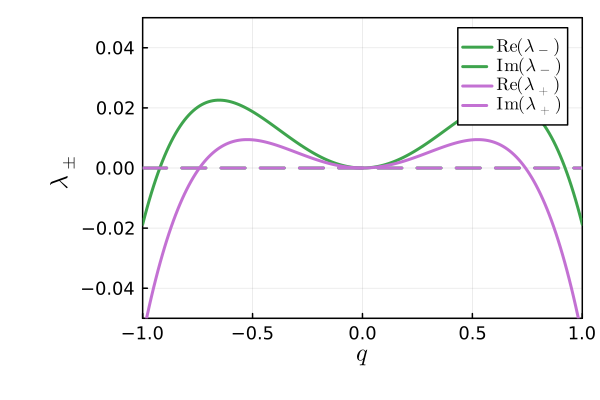

In [4]:
dx = 0.625
Nx = 96
dt = 1e-2
Nt = Int(1e7)
snapshot = 10000
savepath = "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-06-03_juliaMFTest"
ϕA0 = 1/4
ϕB0 = 1/4
δϕA0 = 0.05
δϕB0 = 0.05
α = 0.0
δ = +0.4
κ = -0.3
Tc = (1 + α) * ϕA0
temp = 0.05
Γ = 1.0

DA, DB, Dp, Dm = diffmat(temp, ϕA0, ϕB0, α, δ, κ)
println("D+ = " * string(Dp))
println("D- = " * string(Dm))

qs = collect(-1:0.01:1)
λ1, λ2 = evals(qs, temp, ϕA0, α, δ, κ, Γ);

p = plot(thickness_scaling=1.5, framestyle=:box,
         xlim=(minimum(qs), maximum(qs)), ylim=(-0.05, 0.05),
         xlabel=L"q", ylabel=L"\lambda_\pm")
plot!(qs, real(λ1), label=L"\mathrm{Re}(\lambda_-)", lw=2, color=palette(:default)[3])
plot!(qs, imag(λ1), linestyle=:dash, label=L"\mathrm{Im}(\lambda_-)", lw=2, color=palette(:default)[3])
plot!(qs, real(λ2), label=L"\mathrm{Re}(\lambda_+)", lw=2, color=palette(:default)[4])
plot!(qs, imag(λ2), linestyle=:dash, label=L"\mathrm{Im}(\lambda_+)", lw=2, color=palette(:default)[4])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_evals_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

In [5]:
ϕA, ϕB, t = run_simulation(dx, Nx, dt, Nt, snapshot, savepath,
                           ϕA0=ϕA0, ϕB0=ϕB0, δϕA0=δϕA0, δϕB0=δϕB0,
                           α=α, δ=δ, κ=κ, temp=temp, Γ=Γ)

Starting main loop...


Progress: 100%|█████████████████████████████████████████| Time: 0:06:47


([0.01291109200918892, 0.013566972038552175, 0.01708967206427156, 0.03117515185430281, 0.07354255862678967, 0.16172474013079408, 0.2953823429492059, 0.45372980191537227, 0.6063076057897154, 0.7282463718612662  …  0.012886026828434196, 0.012881645511084854, 0.01287720903024595, 0.012872709472905888, 0.01286814736984523, 0.012863406063599779, 0.012858235135014894, 0.012851311395057526, 0.012841338376730106, 0.012832929609560206], [0.00772316848143455, 0.007773383974306246, 0.00813659162250137, 0.010107544437082682, 0.01814159768401357, 0.0420281012307857, 0.08723210709868864, 0.1411988217703296, 0.17926046905097, 0.1828591687612394  …  0.007631749716894237, 0.007641714559917787, 0.007651655634686784, 0.007661575265593294, 0.0076714683868147095, 0.007681330936182059, 0.007691112188190575, 0.007700664238590167, 0.007709335256054679, 0.0077161665635880295], 99999.99998630969)

In [11]:
ϕA, ϕB, t = run_simulation(ϕA[:, end], ϕB[:, end], dx, Nx, dt, Nt, snapshot, savepath,
                           ϕA0=ϕA0, ϕB0=ϕB0, δϕA0=δϕA0, δϕB0=δϕB0,
                           α=α, δ=δ, κ=κ, temp=temp, Γ=Γ)

Starting main loop...


Progress: 100%|█████████████████████████████████████████| Time: 0:00:46


([0.9661483824891927, 0.9263101395894187, 0.819485755777733, 0.6488942586555165, 0.44474437964678515, 0.25216548390481763, 0.11038645372131302, 0.035562485074563235, 0.011137122727669655, 0.00565685239282061  …  0.006367784076355294, 0.009032118119116412, 0.02067293485886916, 0.06754081651180897, 0.17764152206943495, 0.34977088365291803, 0.5542302113308094, 0.7455216956564774, 0.8848348242956415, 0.9546243389404582], [0.0027075249281252284, 0.005583753203746594, 0.010016694798420541, 0.012722290049659935, 0.012612833722811195, 0.010859346409221782, 0.009581424610807536, 0.01235584454321634, 0.03278001514503276, 0.10137971633344293  …  0.05252962987266053, 0.01646011289548399, 0.008976300445705224, 0.008569421072992803, 0.010007954327961742, 0.011915993253546777, 0.012990645066766069, 0.011635441429845027, 0.0076925723969715, 0.0036632733410522315], 99999.99998630969)

$D_+ = 0.025$, $D_- = 0$

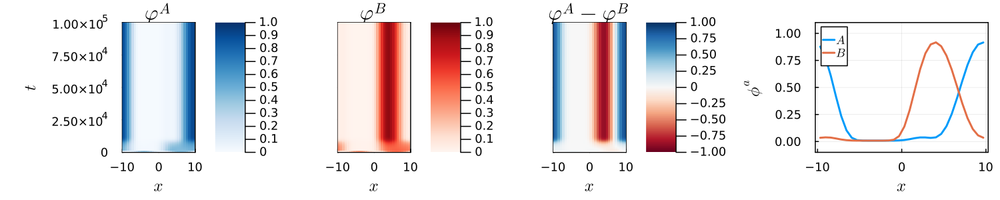

In [67]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

$D_+ = 0.025$, $D_- = 0.03125$

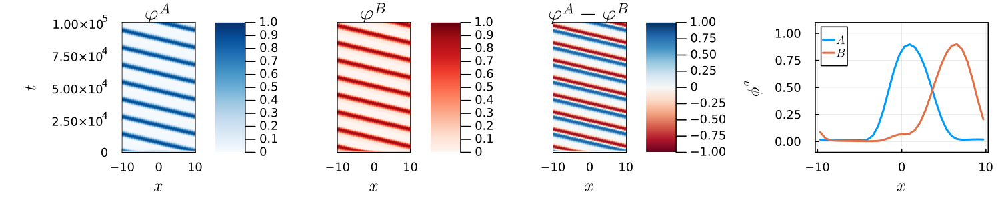

In [76]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

$D_+ = 0.025$, $D_- = -0.03125$

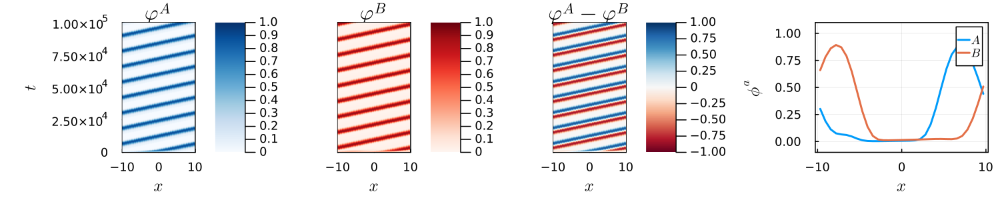

In [80]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

$D_+ = -0.025$, $D_- = 0$.

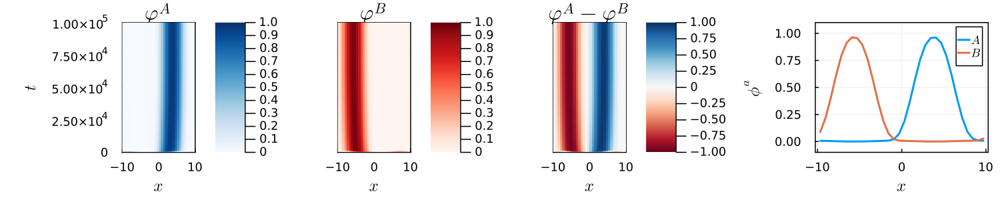

In [59]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

$D_+ = -0.025$, $D_- = -0.03125$.

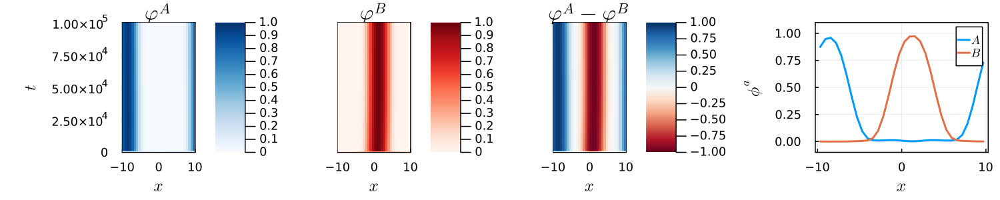

In [83]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

$D_+ = -0.025$, $D_- = 0.03125$.

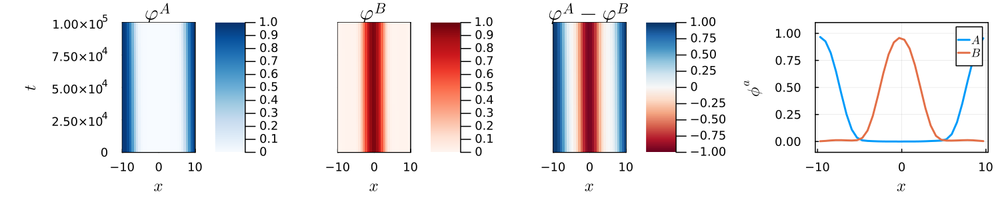

In [12]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

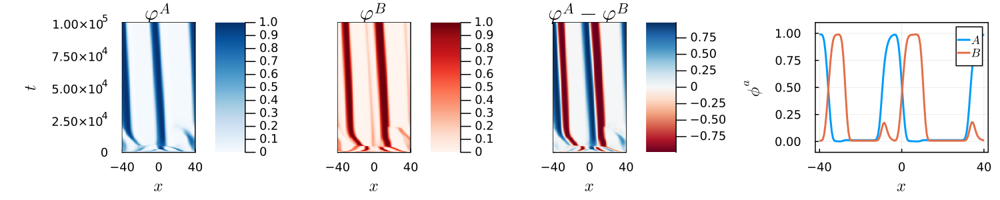

In [57]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu,
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

[ Info: Saved animation to /Users/danny/code/uchicago/adaptation/schelling/meanField/SchellingMF/tmp.gif


Plots.AnimatedGif("/Users/danny/code/uchicago/adaptation/schelling/meanField/SchellingMF/tmp.gif")
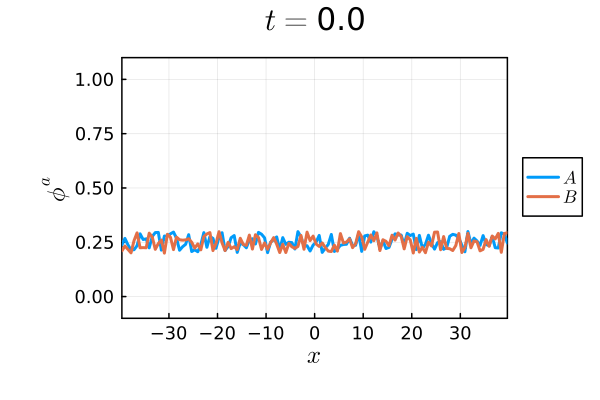

In [58]:
# ϕA, ϕB, x, t = load_data(savepath)
anim = @gif for ii in 1:2:length(t)
    plot(x, ϕA[:, ii], lw=2, label=L"A")
    plot!(x, ϕB[:, ii], lw=2, label=L"B")
    plot!(ylim=(-0.1, 1.1), xlims=(minimum(x), maximum(x)),
          framestyle=:box, thickness_scaling=1.5,
          xlabel=L"x", ylabel=L"\phi^a",
          title=L"t = " * string(round.(t[ii], digits=2)),
          leg=:outerright)
end

# mp4(anim, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-06-13_α0.0_δ2.0_ϕ0.25_T0.1_sineIC.mp4", fps=20)

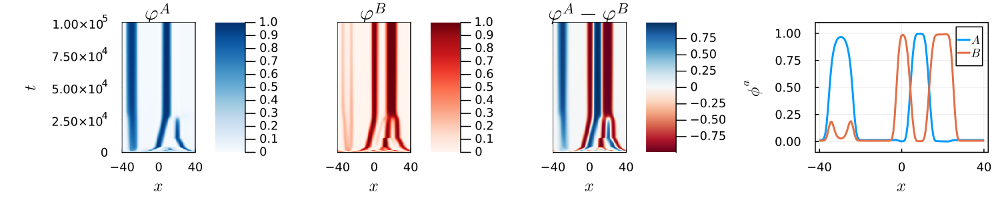

In [6]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu,
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

In [22]:
dx = 0.625
Nx = 64
dt = 1e-2
Nt = Int(1e7)
snapshot = 50000
savepath = "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-06-03_juliaMFTest"
ϕA0 = 1/4
ϕB0 = 1/4
δϕA0 = 0.05
δϕB0 = 0.05
α = 0.0
δ = 0.3
κ = 0.2
temp = 1/30
Γ = 1.0

ϕA, ϕB, t = run_simulation(dx, Nx, dt, Nt,
                           snapshot, savepath,
                           ϕA0=ϕA0, ϕB0=ϕB0, δϕA0=δϕA0, δϕB0=δϕB0,
                           α=α, δ=δ, κ=κ, temp=temp, Γ=Γ)

Starting main loop...


Progress:  70%|████████████████████████████▊            |  ETA: 0:00:38

LoadError: InterruptException:

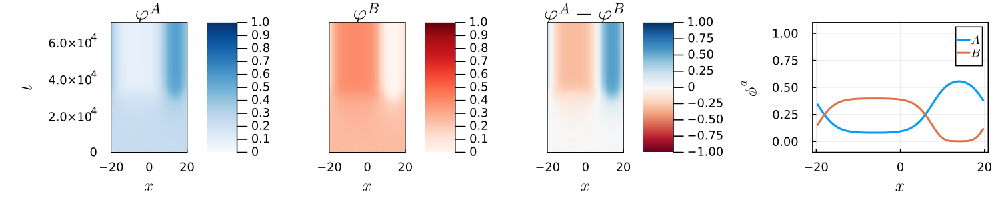

In [23]:
ϕA, ϕB, x, t, params = load_data(savepath)

hA = heatmap(x, t, transpose(ϕA),
             cmap=:Blues, clims=(0, 1),
             title=L"ϕ^A", xlabel=L"x", ylabel=L"t")
hB = heatmap(x, t, transpose(ϕB),
             cmap=:Reds, clims=(0, 1),
             title=L"ϕ^B", yformatter=_->"", xlabel=L"x")
hC = heatmap(x, t, transpose(ϕA - ϕB),
             cmap=:RdBu, clims=(-1, 1),
             title=L"ϕ^A - ϕ^B", yformatter=_->"", xlabel=L"x")
pf = plot(x, ϕA[:, end], lw=2, label=L"A")
plot!(x, ϕB[:, end], ylim=(-0.1, 1.1), lw=2, label=L"B")
plot!(xlabel=L"x", ylabel=L"\phi^a")

p = plot(hA, hB, hC, pf, layout=(1, 4),
     framestyle=:box, size=(1500, 300), legend=true,
     thickness_scaling=1.5, bottom_margin=5Plots.mm, xticks=[-(Nx*dx)/2, 0, Nx*dx/2])

# savefig(p, "/Users/danny/Google Drive/My Drive/uchicago/adaptation/schelling/2023-07-06_schellingMF_T$(temp)_κ$(κ)_δ$(δ)_α$(α)_ϕ$(ϕA0)_Γ$(Γ).pdf")
display(p)

In [10]:
function entropy_index(pop)
    ni, nm = size(pop)
    
    T = sum(pop);
    ti = sum(pop, dims=2);
    tm = sum(pop, dims=1);
    pim = pop ./ ti;
    pm = tm ./ T;
    
    E = entropy(pm)
    norm = T * E
    
    kl = [kldivergence(pim[i, :], pm) for i in 1:ni]
    h = sum(ti .* kl)
    H = h / norm

    return H
end

function dissimilarity_index(pop)
    ni, nm = size(pop)

    T = sum(pop);
    ti = vec(sum(pop, dims=2));
    tm = vec(sum(pop, dims=1));
    pim = pop ./ ti;
    pm = vec(tm ./ T);

    norm = @. 2 * T * pm[1] * (1 - pm[1])
    d = sum(ti .* [abs.(pim[i, 1] - pm[1]) for i in 1:ni], dims=1)
    D = d ./ norm
    return D
end

dissimilarity_index (generic function with 1 method)

In [11]:
h = mean([entropy_index([abs.(ϕA[:, i]) abs.(ϕB[:, i])]) for i in 1:201])
d = mean([dissimilarity_index([abs.(ϕA[:, i]) abs.(ϕB[:, i])]) for i in 1:201])

1-element Vector{Float64}:
 0.5071358389086994

In [12]:
h

0.27395995599262984

In [13]:
d

1-element Vector{Float64}:
 0.5071358389086994